Attempting to load image from: c:\Users\Usuario\Desktop\7 Semestre\Visual\computacion-visual-Daniel\2025-05-03_taller_imagen_matriz_pixeles\Capturas\J.jpg
Current working directory: c:\Users\Usuario\Desktop\7 Semestre\Visual\computacion-visual-Daniel\2025-05-03_taller_imagen_matriz_pixeles\python
Script directory: c:\Users\Usuario\Desktop\7 Semestre\Visual\computacion-visual-Daniel\2025-05-03_taller_imagen_matriz_pixeles\python
Loading image...


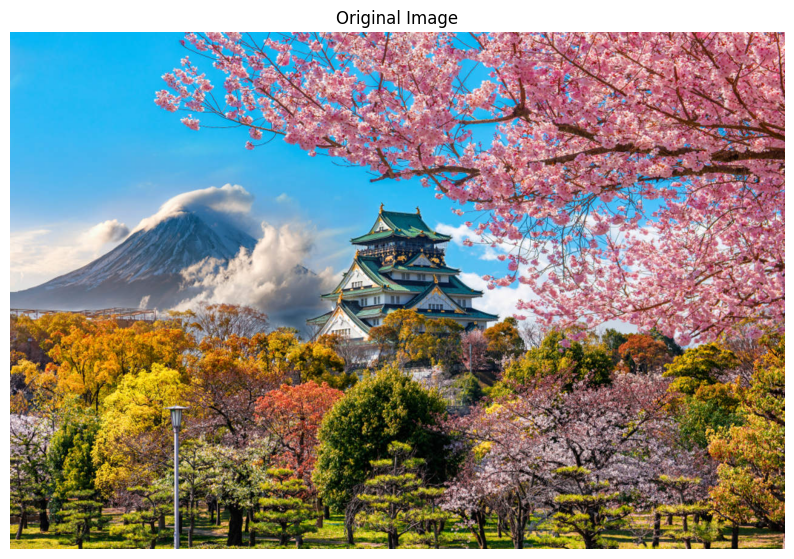

Image dimensions: (854, 1280, 3)
Image data type: uint8

Displaying color channels...


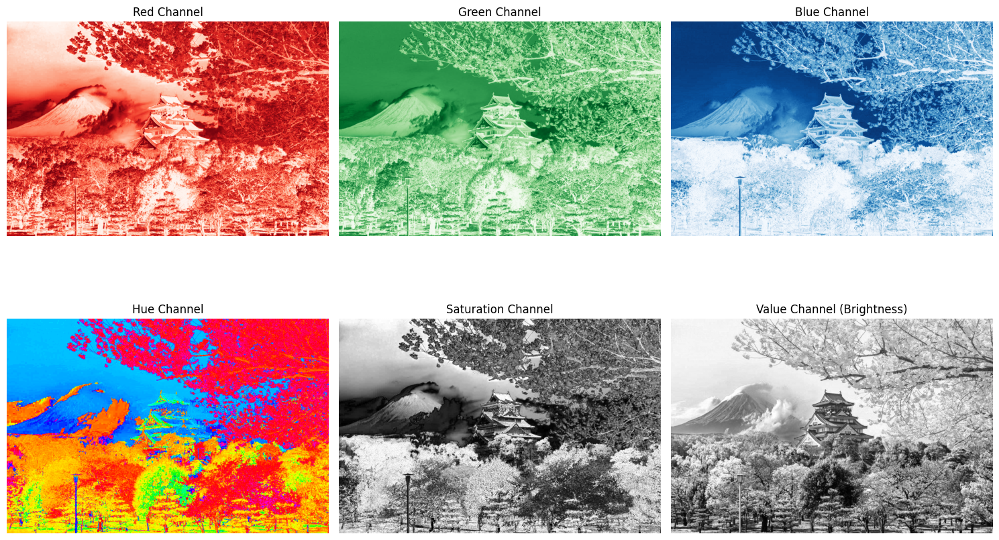


Modifying image regions...


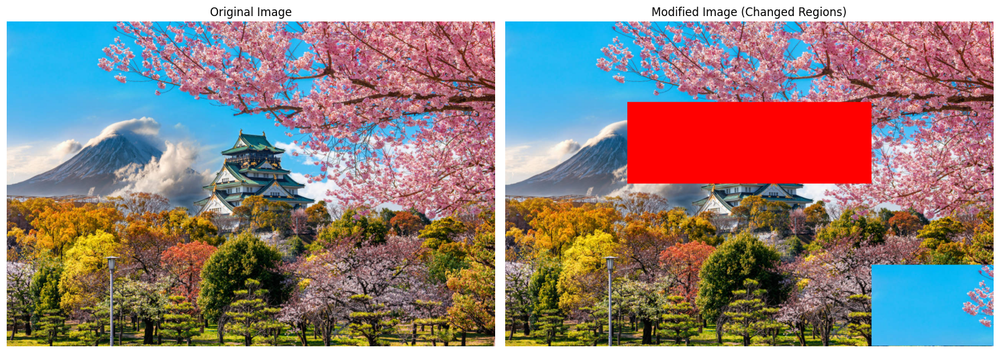


Calculating and displaying histograms...


C:\Users\Usuario\AppData\Local\Temp\ipykernel_25964\3369098753.py:172: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(img_gray.ravel(), 256, [0, 256], color='gray', alpha=0.7)


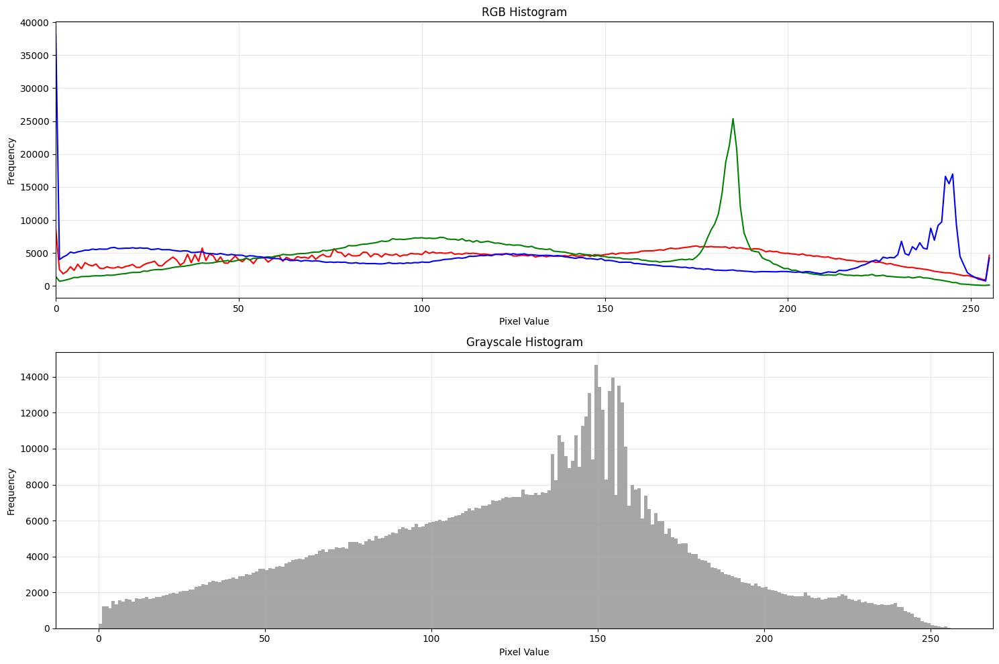


Adjusting brightness and contrast...


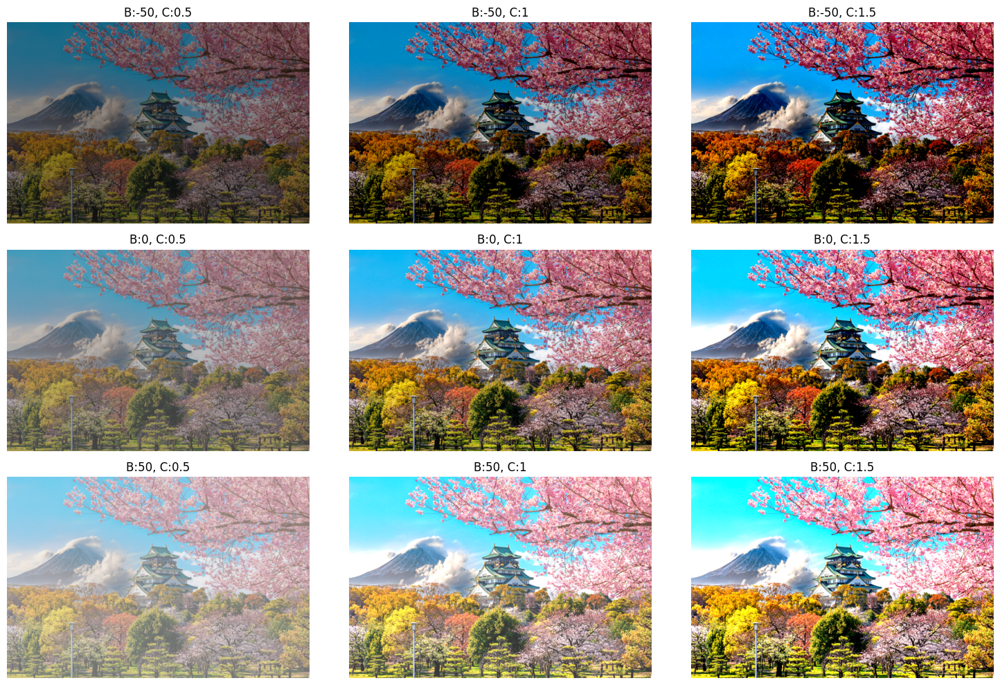

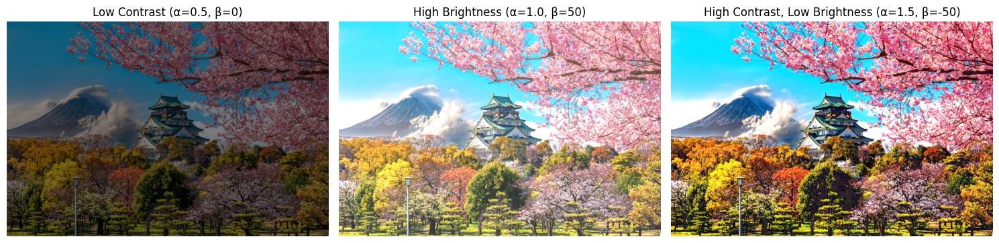


Launching interactive brightness and contrast tool...


In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
from tkinter import *
from tkinter import ttk
from PIL import Image, ImageTk
import os

def load_and_display_image(img_path):
    """Load an image and display its basic properties"""
    # Check if file exists
    if not os.path.exists(img_path):
        print(f"Error: Image file {img_path} not found.")
        return None
    
    # Read the image
    img = cv2.imread(img_path)
    if img is None:
        print(f"Error: Could not read image from {img_path}")
        return None
    
    # Convert BGR to RGB for display
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Display original image
    plt.figure(figsize=(10, 8))
    plt.imshow(img_rgb)
    plt.title("Original Image")
    plt.axis('off')
    plt.show()
    
    # Print basic image information
    print(f"Image dimensions: {img.shape}")
    print(f"Image data type: {img.dtype}")
    
    return img

def display_color_channels(img):
    """Display the RGB and HSV channels of an image separately"""
    # Convert BGR to RGB
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Convert BGR to HSV
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    # Extract RGB channels
    r_channel, g_channel, b_channel = cv2.split(img_rgb)
    
    # Extract HSV channels
    h_channel, s_channel, v_channel = cv2.split(img_hsv)
    
    # Display RGB channels
    plt.figure(figsize=(15, 10))
    
    plt.subplot(2, 3, 1)
    plt.imshow(r_channel, cmap='Reds')
    plt.title('Red Channel')
    plt.axis('off')
    
    plt.subplot(2, 3, 2)
    plt.imshow(g_channel, cmap='Greens')
    plt.title('Green Channel')
    plt.axis('off')
    
    plt.subplot(2, 3, 3)
    plt.imshow(b_channel, cmap='Blues')
    plt.title('Blue Channel')
    plt.axis('off')
    
    # Display HSV channels
    plt.subplot(2, 3, 4)
    plt.imshow(h_channel, cmap='hsv')
    plt.title('Hue Channel')
    plt.axis('off')
    
    plt.subplot(2, 3, 5)
    plt.imshow(s_channel, cmap='gray')
    plt.title('Saturation Channel')
    plt.axis('off')
    
    plt.subplot(2, 3, 6)
    plt.imshow(v_channel, cmap='gray')
    plt.title('Value Channel (Brightness)')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

def modify_image_regions(img):
    """Modify specific regions of the image using matrix slicing"""
    # Make a copy to avoid modifying the original
    img_modified = img.copy()
    img_rgb = cv2.cvtColor(img_modified, cv2.COLOR_BGR2RGB)
    
    height, width = img_modified.shape[:2]
    
    # 1. Change the color of a rectangular area
    # Define a rectangle in the upper part
    x1, y1 = width // 4, height // 4
    x2, y2 = 3 * width // 4, height // 2
    
    # Set the region to a specific color (bright red in BGR)
    img_modified[y1:y2, x1:x2] = [0, 0, 255]  # BGR color
    
    # 2. Copy a region to another location
    # Define source and target regions
    src_x1, src_y1 = 0, 0
    src_x2, src_y2 = width // 4, height // 4
    
    # Get the exact dimensions of the source region
    src_height = src_y2 - src_y1
    src_width = src_x2 - src_x1
    
    # Define target based on the EXACT dimensions of source
    dst_x1, dst_y1 = 3 * width // 4, 3 * height // 4
    dst_x2, dst_y2 = dst_x1 + src_width, dst_y1 + src_height
    
    # Ensure destination is within image bounds
    dst_x2 = min(dst_x2, width)
    dst_y2 = min(dst_y2, height)
    
    # Copy region
    region_to_copy = img_modified[src_y1:src_y2, src_x1:src_x2].copy()
    img_modified[dst_y1:dst_y2, dst_x1:dst_x2] = region_to_copy
    
    # Display results
    plt.figure(figsize=(15, 10))
    
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img_modified, cv2.COLOR_BGR2RGB))
    plt.title('Modified Image (Changed Regions)')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return img_modified

def calculate_and_display_histogram(img):
    """Calculate and display intensity histograms of the image"""
    # Convert to RGB for consistent plotting
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Plot RGB histograms using matplotlib
    plt.figure(figsize=(15, 10))
    
    # RGB Histograms
    color_spaces = [('RGB', img_rgb, ['r', 'g', 'b'])]
    
    for i, (name, image, c) in enumerate(color_spaces):
        plt.subplot(2, 1, i+1)
        for j, col in enumerate(c):
            # Calculate histogram
            hist = cv2.calcHist([image], [j], None, [256], [0, 256])
            plt.plot(hist, color=col)
        
        plt.title(f'{name} Histogram')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')
        plt.xlim([0, 256])
        plt.grid(alpha=0.3)
    
    # Grayscale histogram
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    plt.subplot(2, 1, 2)
    plt.hist(img_gray.ravel(), 256, [0, 256], color='gray', alpha=0.7)
    plt.title('Grayscale Histogram')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()

def adjust_brightness_contrast(img):
    """Apply brightness and contrast adjustments"""
    
    def apply_brightness_contrast(img, brightness=0, contrast=1):
        """Apply brightness and contrast adjustment using equation"""
        # Equation: new_pixel = contrast * (old_pixel - 128) + 128 + brightness
        img = img.astype(np.float32)
        img = contrast * (img - 128) + 128 + brightness
        img = np.clip(img, 0, 255).astype(np.uint8)
        return img
    
    # Create different adjustments
    brightness_values = [-50, 0, 50]
    contrast_values = [0.5, 1, 1.5]
    
    fig, axs = plt.subplots(len(brightness_values), len(contrast_values), 
                          figsize=(15, 10))
    
    for i, brightness in enumerate(brightness_values):
        for j, contrast in enumerate(contrast_values):
            # Manual adjustment (equation-based)
            adjusted_img = apply_brightness_contrast(img.copy(), brightness, contrast)
            
            # Display
            axs[i, j].imshow(cv2.cvtColor(adjusted_img, cv2.COLOR_BGR2RGB))
            axs[i, j].set_title(f'B:{brightness}, C:{contrast}')
            axs[i, j].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Second method: Using OpenCV's convertScaleAbs
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    alpha = 0.5  # contrast
    beta = 0  # brightness
    img_adj1 = cv2.convertScaleAbs(img, alpha=alpha, beta=beta)
    plt.imshow(cv2.cvtColor(img_adj1, cv2.COLOR_BGR2RGB))
    plt.title(f'Low Contrast (α={alpha}, β={beta})')
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    alpha = 1.0
    beta = 50
    img_adj2 = cv2.convertScaleAbs(img, alpha=alpha, beta=beta)
    plt.imshow(cv2.cvtColor(img_adj2, cv2.COLOR_BGR2RGB))
    plt.title(f'High Brightness (α={alpha}, β={beta})')
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    alpha = 1.5
    beta = -50
    img_adj3 = cv2.convertScaleAbs(img, alpha=alpha, beta=beta)
    plt.imshow(cv2.cvtColor(img_adj3, cv2.COLOR_BGR2RGB))
    plt.title(f'High Contrast, Low Brightness (α={alpha}, β={beta})')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

def interactive_brightness_contrast(img_path):
    """Create interactive sliders for brightness and contrast adjustment"""
    
    def update_image(val):
        # Get current parameter values from sliders
        brightness = int(brightness_slider.get())
        contrast = float(contrast_slider.get())
        
        # Apply transformations
        alpha = contrast  # Contrast control (1.0-3.0)
        beta = brightness  # Brightness control (0-100)
        
        # Apply brightness and contrast adjustment
        adjusted = cv2.convertScaleAbs(orig_img, alpha=alpha, beta=beta)
        
        # Convert the result to RGB for display
        adjusted_rgb = cv2.cvtColor(adjusted, cv2.COLOR_BGR2RGB)
        
        # Convert to ImageTk format
        img_tk = ImageTk.PhotoImage(Image.fromarray(adjusted_rgb))
        
        # Update the image in the canvas
        canvas.img = img_tk  # Keep a reference to prevent garbage collection
        canvas.itemconfig(image_container, image=img_tk)
        
        # Update parameter display
        param_label.config(text=f"Brightness: {brightness}, Contrast: {contrast:.1f}")
    
    # Create main window
    root = Tk()
    root.title("Brightness and Contrast Adjustment")
    
    # Load the image
    orig_img = cv2.imread(img_path)
    
    # Resize image if too large
    height, width = orig_img.shape[:2]
    max_size = 800
    if height > max_size or width > max_size:
        scale = max_size / max(height, width)
        new_width = int(width * scale)
        new_height = int(height * scale)
        orig_img = cv2.resize(orig_img, (new_width, new_height))
    
    # Initial converted image
    img_rgb = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    img_pil = Image.fromarray(img_rgb)
    img_tk = ImageTk.PhotoImage(img_pil)
    
    # Image display
    canvas = Canvas(root, width=img_pil.width, height=img_pil.height)
    canvas.pack()
    
    # Display the image on the canvas
    image_container = canvas.create_image(0, 0, anchor="nw", image=img_tk)
    
    # Control frame
    control_frame = Frame(root)
    control_frame.pack(pady=10)
    
    # Brightness slider
    Label(control_frame, text="Brightness").grid(row=0, column=0, padx=10)
    brightness_slider = Scale(control_frame, from_=-100, to=100, orient=HORIZONTAL, 
                           length=300, command=lambda x: update_image(None))
    brightness_slider.set(0)
    brightness_slider.grid(row=0, column=1)
    
    # Contrast slider
    Label(control_frame, text="Contrast").grid(row=1, column=0, padx=10)
    contrast_slider = Scale(control_frame, from_=0.1, to=3.0, orient=HORIZONTAL, 
                         length=300, resolution=0.1, command=lambda x: update_image(None))
    contrast_slider.set(1.0)
    contrast_slider.grid(row=1, column=1)
    
    # Parameter display label
    param_label = Label(control_frame, text="Brightness: 0, Contrast: 1.0")
    param_label.grid(row=2, column=0, columnspan=2, pady=10)
    
    # Reset button
    reset_button = Button(control_frame, text="Reset", command=lambda: (
        brightness_slider.set(0),
        contrast_slider.set(1.0),
        update_image(None)
    ))
    reset_button.grid(row=3, column=0, columnspan=2, pady=10)
    
    # Start the main loop
    root.mainloop()

def main():
    """Main function to run all examples"""
    # Use absolute path to find the image
    import os
    script_dir = os.getcwd()
    
    # Build the absolute path to the image
    img_path = os.path.join(os.path.dirname(script_dir), 'Capturas', 'J.jpg')
    
    print(f"Attempting to load image from: {img_path}")
    print(f"Current working directory: {os.getcwd()}")
    print(f"Script directory: {script_dir}")
    
    # Check if the file exists
    if not os.path.exists(img_path):
        print(f"ERROR: Image file not found at {img_path}")
        return
    
    print("Loading image...")
    img = load_and_display_image(img_path)
    
    if img is None:
        print("Failed to load image. Please check the path and try again.")
        return
    
    print("\nDisplaying color channels...")
    display_color_channels(img)
    
    print("\nModifying image regions...")
    modified_img = modify_image_regions(img)
    
    print("\nCalculating and displaying histograms...")
    calculate_and_display_histogram(img)
    
    print("\nAdjusting brightness and contrast...")
    adjust_brightness_contrast(img)
    
    print("\nLaunching interactive brightness and contrast tool...")
    interactive_brightness_contrast(img_path)

main()

  